In [18]:
#online predictor clocks
library(readxl)
library(ggplot2)
library(cowplot)
load("/share/hennlab/vault/people/shyamie/methylation/results/literature_sites.RData")
Hannum.WB.2013 <- as.character(Hannum.WB.2013$cpg.site)

phenoage <- read.delim("/share/hennlab/users/glmeeks/age_methylation/age_prediction/pheno_age.tsv", sep="\t")
phenoage <- phenoage[-1,]
Horvath <- read.csv("/share/hennlab/users/glmeeks/age_methylation/methylation_norm_EWAS/EMMAX/Horvath_test/AdditionalFile23predictor.csv")
Horvath <- Horvath[-1,]
Horvath_sites <- Horvath$CpGmarker

skin_blood_horvath <- read_excel("/share//hennlab/users/glmeeks/age_methylation/EMMAX_meqtl/New_lit_sites_Oblak/Horvath_skin_blood_2018.xlsx", col_names=FALSE)
skin_blood <- as.vector(skin_blood_horvath[,1])
skin_blood <- skin_blood[[1]]

try({
  data <- readRDS("/share//hennlab/users/glmeeks/age_methylation/age_prediction/DNAmFitnessModelsandFitAge_Oct2022.rds")
}, silent = TRUE)

# Check if the data was loaded correctly
if (exists("data")) {
  print("File loaded successfully.")
} else {
  print("Failed to load file. The file may be corrupted or in an incorrect format.")
}
ls()
Fitage <- data$AllCpGs

Zhang <- read.delim("/share//hennlab/users/glmeeks/age_methylation/EMMAX_meqtl/New_lit_sites_Oblak/Zhang_2019.txt", header=FALSE, sep="")


clock_cpgs <- unique(c(Hannum.WB.2013, Horvath_sites, skin_blood, phenoage$CpG, Fitage, Zhang$V1))
phenoage <- phenoage$CpG
Zhang <- Zhang$V1
save(list=c("Hannum.WB.2013", "Horvath_sites", "skin_blood", "phenoage", "Fitage", "Zhang"), file="clock_cpgs.Rdata")


New names:
* `` -> `...1`


[1] "File loaded successfully."


[1] "Alisch.PBMCs.2013"                "all_heritable_cpgs"              
 [3] "all_meqtl_cpgs"                   "any_heritable_or_meqtl"          
 [5] "Baka_1kg_fst"                     "Baka_heritable_cpgs"             
 [7] "Baka_meqtl_cpgs"                  "Bell.WB.2012"                    
 [9] "Bocklandt.Saliva.2011"            "clock"                           
[11] "clock_"                           "clock_cpgs"                      
[13] "clocks"                           "Cruickshank.blood.2013"          
[15] "data"                             "Fernandez.MSCs.2015"             
[17] "Fitage"                           "Florath.WB.2013"                 
[19] "fraction_meQTL_CpGs"              "Garagnani.WB.2012"               
[21] "Hannum.WB.2013"                   "heritable_in_any_pop_or_combined"
[23] "Heyn.cordblood.PBMCs.2012"        "Himba_heritable_cpgs"            
[25] "Himba_meqtl_cpgs"                 "Horvath"                         
[27] "Horvath_sites"                    "Johansson.WBCs.2013"             
[29] "Kananen.WB.2016"                  "KHS_heritable_cpgs"              
[31] "KHS_meqtl_cpgs"                   "Marttila.leukocytes.2015"        
[33] "meQTL_CpGs"                       "meqtl_in_any_pop_or_combined"    
[35] "phenoage"                         "pop_spec_heritable_cpgs"         
[37] "pop_spec_meqtl_cpgs"              "Raykan.WB.2010"                  
[39] "result_df"                        "skin_blood"                      
[41] "skin_blood_horvath"               "Smith.PBMCs.2014"                
[43] "Teschendorff.WB.2010"             "Weidner.blood.2014"              
[45] "Xu.WB.2014"                       "Zaghlool.WB.2015"                
[47] "Zhang"

In [19]:
#Hannum.WB.2013
#Horvath_sites
#skin_blood
#phenoage
#Fitage
#Zhang

In [22]:
load("meqtl_cpgs.RData")
load("heritable_cpgs.RData")
any_heritable_or_meqtl <- unique(c(pop_spec_meqtl_cpgs, pop_spec_heritable_cpgs))
result_df <- data.frame(
  Clock = character(),
  meQTL_CpGs = character(),
  Fraction_meQTL_CpGs = numeric(),
  stringsAsFactors = FALSE
)

# List of clocks
clocks <- c("Hannum.WB.2013", "Horvath_sites", "skin_blood", "phenoage", "Fitage", "Zhang")

# Loop over each clock and compute the required values
for (clock_ in clocks) {
  clock <- get(clock_)
  
  # Compute values
  meQTL_CpGs <- clock[clock %in% any_heritable_or_meqtl]
  fraction_meQTL_CpGs <- length(meQTL_CpGs) / length(clock)
  
  # Add to result data frame
  result_df <- rbind(result_df, data.frame(
    Clock = clock_,
    meQTL_CpGs = paste(meQTL_CpGs, collapse = ", "),
    Fraction_meQTL_CpGs = fraction_meQTL_CpGs,
    stringsAsFactors = FALSE
  ))
}

length(pop_spec_meqtl_cpgs[pop_spec_meqtl_cpgs%in%pop_spec_heritable_cpgs])
length(pop_spec_meqtl_cpgs)
result_df
write.csv(result_df, "heritable_cpgs_in_predictors.csv")

[1] 51023

[1] 143550

Clock,meQTL_CpGs,Fraction_meQTL_CpGs
<chr>,<chr>,<dbl>
Hannum.WB.2013,"cg22512670, cg25410668, cg16054275, cg09809672, cg04474832, cg08234504, cg23500537, cg22736354, cg20426994, cg08097417, cg07955995, cg07583137, cg19935065, cg01528542, cg04416734, cg06874016",0.2253521
Horvath_sites,"cg00374717, cg00945507, cg01353448, cg02085507, cg02154074, cg02217159, cg02332492, cg02489552, cg03167275, cg03565323, cg03760483, cg04126866, cg04528819, cg05755779, cg05921699, cg06144905, cg06738602, cg06952310, cg07285276, cg07455279, cg08030082, cg08251036, cg08370996, cg08413469, cg08771731, cg09118625, cg09885951, cg10486998, cg10920957, cg12373771, cg13038560, cg13216057, cg13319175, cg13682722, cg13854874, cg13975369, cg14329157, cg14424579, cg14723032, cg14894144, cg16150435, cg17285325, cg17655614, cg17960516, cg18055007, cg18440048, cg18573383, cg19008809, cg19305227, cg19514928, cg20761322, cg20914508, cg21096399, cg21378206, cg22289837, cg22449114, cg22736354, cg22901840, cg23517605, cg23941599, cg24116886, cg25552492, cg26003813, cg26005082, cg26297688, cg26453588, cg27494383, cg00168942, cg00431549, cg01262913, cg01407797, cg01459453, cg01511567, cg01560871, cg01570885, cg01820374, cg02071305, cg03019000, cg03286783, cg03330058, cg04268405, cg04431054, cg04452713, cg04474832, cg04999691, cg07388493, cg07408456, cg07730301, cg07770222, cg08331960, cg09133026, cg09646392, cg09722397, cg09809672, cg10045881, cg10266490, cg10865119, cg11025793, cg11388238, cg12941369, cg13269407, cg13547237, cg14175438, cg14727952, cg15262928, cg15703512, cg15804973, cg16034652, cg16744741, cg16984944, cg17589341, cg17686885, cg19046959, cg19420968, cg19724470, cg19853760, cg22171829, cg22190114, cg22197830, cg22637507, cg22947000, cg23124451, cg23786576, cg24058132, cg24471894, cg24888049, cg25101936, cg25809905, cg25928579, cg26394940, cg26723847, cg26824091, cg27015931, cg27016307, cg27544190",0.3824363
skin_blood,"cg26933021, cg25410668, cg19269039, cg25256723, cg16054275, cg01459453, cg02901139, cg09809672, cg12869659, cg10959651, cg00522231, cg01752203, cg07589899, cg22943590, cg12082609, cg01447660, cg00017842, cg01620164, cg12105450, cg08166272, cg20669012, cg15910502, cg12941369, cg02244028, cg16933388, cg19381811, cg03019000, cg01844642, cg04474832, cg11205552, cg18303397, cg07110949, cg23995914, cg21815258, cg20755989, cg12238343, cg21878650, cg08234504, cg23500537, cg08587542, cg14314729, cg23517605, cg01570885, cg00194146, cg22736354, cg10699171, cg02281167, cg18468088, cg03894990, cg07095347, cg00073460, cg00795927, cg08911208, cg22372849, cg16012294, cg27009703, cg26312920, cg14396995, cg18442362, cg09748749, cg23857078, cg14175438, cg04528819, cg20426994, cg08097417, cg26101086, cg07502389, cg18267374, cg07583137, cg19724470, cg07211259, cg10570177, cg13734401, cg26581729, cg06231995, cg14411282, cg01560871, cg04268405, cg04126866, cg13848598, cg07906193, cg12776156, cg05928581, cg22843803, cg13547237, cg18633600, cg01820374, cg25719851, cg13828440, cg00431549, cg26311454, cg18573383, cg15405572, cg01528542, cg08993878, cg21907579, cg18582260, cg22179082, cg06648759, cg23357533, cg23389651, cg09646392, cg06738602, cg18771300, cg24058132, cg14334310, cg02071305, cg25005357, cg15188939, cg20540209, cg09183146, cg00454305, cg26974444, cg10917602, cg09155044, cg18693704, cg22947000, cg02228185, cg25135555, cg06144905, cg06874016, cg25809905, cg13093111, cg10644544, cg03643998, cg11620135, cg25436157, cg24217948, cg17589341, cg26005082, cg10586358, cg15811427, cg06458239, cg21911021, cg12303084, cg27544190, cg01262913, cg10636297, cg12373771, cg16612562, cg21205978, cg01949403, cg19853760, cg23124451, cg00347775, cg27131176",0.3734015
phenoage,"cg22736354, cg02503970, cg11426590, cg13631913, cg27493997, cg14281160, cg12247247, cg08331960, cg01254459, cg15447479, cg27015931, cg03535648, cg14175438, cg13509147, cg18693704, cg00462994, cg00261781, cg13514050, cg18267374, cg10636246, cg15569512, cg14689355, cg19008809, cg09809672, cg13994175

In [11]:
# ###not really top meqtl, all meqtls

# library("ggpointdensity")
# library("viridis")
# KHS_top_meqtl <- read.delim("KHS_meqtl_eur_freq_update_to_Eur_freq_base/combined_KHS_meqtls.txt", sep=" ", header=FALSE)
# KHS_top_meqtl <- na.omit(KHS_top_meqtl[!duplicated(KHS_top_meqtl),])
# nrow(KHS_top_meqtl)
# names(KHS_top_meqtl) <- c("cpg", "snp", "af", "euro_af")
# KHS_top_meqtl$in_clock <- 0
# KHS_top_meqtl[KHS_top_meqtl$cpg %in% clock_cpgs, "in_clock"] <- 1
# KHS_top_meqtl$in_clock <- as.factor(KHS_top_meqtl$in_clock)
# print(paste0("% that are 0 in euro: ", nrow(KHS_top_meqtl[KHS_top_meqtl$euro_af == 0, ])/nrow(KHS_top_meqtl)))
# print(paste0("% that are not found in euro: ", nrow(KHS_top_meqtl[KHS_top_meqtl$euro_af == "notfound", ])/nrow(KHS_top_meqtl)))
# KHS_top_meqtl[KHS_top_meqtl$euro_af == "notfound", "euro_af"] <- 0
# KHS_top_meqtl$euro_af <- as.numeric(KHS_top_meqtl$euro_af)
# KHS_top_meqtl$af <- as.numeric(KHS_top_meqtl$af)


# Baka_top_meqtl <- read.delim("Baka_meqtl_eur_freq_update_to_Eur_freq_base/combined_Baka_meqtls.txt", sep=" ", header=FALSE)
# Baka_top_meqtl <- na.omit(Baka_top_meqtl[!duplicated(Baka_top_meqtl),])
# nrow(Baka_top_meqtl)
# names(Baka_top_meqtl) <- c("cpg", "snp", "af", "euro_af")
# Baka_top_meqtl$in_clock <- 0
# Baka_top_meqtl[Baka_top_meqtl$cpg %in% clock_cpgs, "in_clock"] <- 1
# Baka_top_meqtl$in_clock <- as.factor(Baka_top_meqtl$in_clock)
# print(paste0("% that are 0 in euro: ", nrow(Baka_top_meqtl[Baka_top_meqtl$euro_af == 0, ])/nrow(Baka_top_meqtl)))
# print(paste0("% that are not found in euro: ",nrow(Baka_top_meqtl[Baka_top_meqtl$euro_af == "notfound", ])/nrow(Baka_top_meqtl)))
# Baka_top_meqtl[Baka_top_meqtl$euro_af == "notfound", "euro_af"] <- 0
# Baka_top_meqtl$euro_af <- as.numeric(Baka_top_meqtl$euro_af)
# Baka_top_meqtl$af <- as.numeric(Baka_top_meqtl$af)


# Himba_top_meqtl <- read.delim("Himba_meqtl_eur_freq_update_to_Eur_freq_base/combined_Himba_meqtls.txt", sep=" ", header=FALSE)
# Himba_top_meqtl <- na.omit(Himba_top_meqtl[!duplicated(Himba_top_meqtl),])
# nrow(Himba_top_meqtl)
# names(Himba_top_meqtl) <- c("cpg", "snp", "af", "euro_af")
# Himba_top_meqtl$in_clock <- 0
# Himba_top_meqtl[Himba_top_meqtl$cpg %in% clock_cpgs, "in_clock"] <- 1
# Himba_top_meqtl$in_clock <- as.factor(Himba_top_meqtl$in_clock)
# print(paste0("% that are 0 in euro: ", nrow(Himba_top_meqtl[Himba_top_meqtl$euro_af == 0, ])/nrow(Himba_top_meqtl)))
# print(paste0("% that are not found in euro: ", nrow(Himba_top_meqtl[Himba_top_meqtl$euro_af == "notfound", ])/nrow(Himba_top_meqtl)))
# Himba_top_meqtl[Himba_top_meqtl$euro_af == "notfound", "euro_af"] <- 0
# Himba_top_meqtl$euro_af <- as.numeric(Himba_top_meqtl$euro_af)
# Himba_top_meqtl$af <- as.numeric(Himba_top_meqtl$af)


# library(ggplot2)
# library(cowplot)

# options(repr.plot.width = 70, repr.plot.height = 20)
# custom_breaks <- seq(0, 1, by = 0.1)
# custom_breaks_ <- seq(0, 1, by = 0.1)
# plot1 <- ggplot(KHS_top_meqtl, aes(x = af, y = euro_af, color=factor(in_clock), alpha=in_clock)) + 
#   geom_point(size=5, data = subset(KHS_top_meqtl, in_clock == 0)) + 
#   geom_point(size=8, data = subset(KHS_top_meqtl, in_clock == 1)) + 
#   geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
#   labs(title = "Khomani vs European frequency", x = "Khomani Frequency", y = "European Frequency") + 
#   theme_minimal(base_size = 70) + 
#   theme(axis.title = element_text(size = 70),
#         axis.text = element_text(size = 70),
#         plot.title = element_text(size = 70),
#         legend.text = element_text(size = 70),
#         legend.title = element_text(size = 70)) +
#   scale_x_continuous(breaks = custom_breaks_) +
#   scale_y_continuous(breaks = custom_breaks) +
#   scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
#                      labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") +
#   scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") 

# plot2 <- ggplot(Baka_top_meqtl, aes(x = af, y = euro_af, color=factor(in_clock), alpha=in_clock)) + 
#   geom_point(size=5, data = subset(Baka_top_meqtl, in_clock == 0)) + 
#   geom_point(size=8, data = subset(Baka_top_meqtl, in_clock == 1)) + 
#   geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
#   labs(title = "Baka vs European frequency", x = "Baka Frequency", y = "European Frequency") + 
#   theme_minimal(base_size = 70) + 
#   theme(axis.title = element_text(size = 70),
#         axis.text = element_text(size = 70),
#         plot.title = element_text(size = 70),
#         legend.text = element_text(size = 70),
#         legend.title = element_text(size = 70)) +
#   scale_x_continuous(breaks = custom_breaks_) +
#   scale_y_continuous(breaks = custom_breaks) +
#   scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
#                      labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") +
#   scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") 

# plot3 <- ggplot(Himba_top_meqtl, aes(x = af, y = euro_af, color=factor(in_clock), alpha=in_clock)) + 
#   geom_point(size=5, data = subset(Himba_top_meqtl, in_clock == 0)) + 
#   geom_point(size=8, data = subset(Himba_top_meqtl, in_clock == 1)) + 
#   geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
#   labs(title = "Himba vs European frequency", x = "Himba Frequency", y = "European Frequency") + 
#   theme_minimal(base_size = 70) + 
#   theme(axis.title = element_text(size = 70),
#         axis.text = element_text(size = 70),
#         plot.title = element_text(size = 70),
#         legend.text = element_text(size = 70),
#         legend.title = element_text(size = 70)) +
#   scale_x_continuous(breaks = custom_breaks_) +
#   scale_y_continuous(breaks = custom_breaks) +
#   scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
#                      labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide="none") +
#   scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") #+
#   #guides(color = guide_legend(title = "MeQTL Status"))


# # Combine the plots into one row using cowplot
# combined_plots <- plot_grid(plot1, plot2, plot3, nrow=1, labels = c("A", "B", "C"),
#                     label_size = 60) 
# options(repr.plot.width = 60, repr.plot.height = 20)

# svg("Figure6.svg", width=60, height=20)
# # Display the combined plot
# print(combined_plots)
# dev.off()

# length(unique(KHS_top_meqtl$af))
# length(unique(Baka_top_meqtl$af))
# length(unique(Himba_top_meqtl$af))


In [12]:
# ###Baka
# print("here")
# Baka_meqtls <- read.delim("Baka_meqtls.txt", sep=",", header=FALSE)
# head(Baka_meqtls)
# process_column_name <- function(cpg) {
#   cpg_ <- strsplit(cpg, split = "_")[[1]][2]
#   cpg_ <- strsplit(cpg_, split = "\\.txt")[[1]][1]  
#   return(cpg_)
# }

# process_snp_name <- function(snp) {
#   snp_ <- paste0(strsplit(snp, split=":")[[1]][1],":",strsplit(snp, split=":")[[1]][2])
#  return(snp_)
# }
# Baka_meqtls$cpg <- sapply(Baka_meqtls[, 1], process_column_name)
# Baka_meqtls$snp <- sapply(Baka_meqtls[, 2], process_snp_name)

# head(Baka_meqtls)
# nrow(Baka_meqtls)

# ###KHS
# KHS_meqtls <- read.delim("KHS_meqtls.txt", sep=",", header=FALSE)
# process_column_name <- function(cpg) {
#   cpg_ <- strsplit(cpg, split = "_")[[1]][2]
#   cpg_ <- strsplit(cpg_, split = "\\.txt")[[1]][1]  
#   return(cpg_)
# }
# KHS_meqtls$cpg <- sapply(KHS_meqtls[, 1], process_column_name)
# KHS_meqtls$snp <- sapply(KHS_meqtls[, 2], process_snp_name)
# head(KHS_meqtls)
# nrow(KHS_meqtls)


# ###KHS
# Himba_meqtls <- read.delim("Himba_meqtls.txt", sep=",", header=FALSE)
# process_column_name <- function(cpg) {
#   cpg_ <- strsplit(cpg, split = "_")[[1]][2]
#   cpg_ <- strsplit(cpg_, split = "\\.txt")[[1]][1]  
#   return(cpg_)
# }
# Himba_meqtls$cpg <- sapply(Himba_meqtls[, 1], process_column_name)
# Himba_meqtls$snp <- sapply(Himba_meqtls[, 2], process_snp_name)
# head(Himba_meqtls)
# nrow(Himba_meqtls)

# save(list=c("Baka_meqtls","Himba_meqtls", "KHS_meqtls"), file="meqtls.RData")


In [23]:
load("meqtls.RData")
Baka_1kg_fst <- read.delim("Fst_Baka_1kg_meqtl.fst", sep="", header=TRUE)
head(Baka_1kg_fst)
nrow(Baka_1kg_fst)
Baka_1kg_fst <- Baka_1kg_fst[Baka_1kg_fst$SNP %in% Baka_meqtls$snp, ]
Baka_1kg_fst[Baka_1kg_fst$FST < 0, "FST"] <- 0
nrow(Baka_1kg_fst)
mean(Baka_1kg_fst$FST)
summary(Baka_1kg_fst$FST)


KHS_1kg_fst <- read.delim("Fst_KHS_1kg_meqtl.fst", sep="", header=TRUE)
head(KHS_1kg_fst)
nrow(KHS_1kg_fst)
KHS_1kg_fst <- KHS_1kg_fst[KHS_1kg_fst$SNP %in% KHS_meqtls$snp, ]
KHS_1kg_fst[KHS_1kg_fst$FST < 0, "FST"] <- 0
nrow(KHS_1kg_fst)
mean(KHS_1kg_fst$FST)
summary(KHS_1kg_fst$FST)


Himba_1kg_fst <- read.delim("Fst_Himba_1kg_meqtl.fst", sep="", header=TRUE)
head(Himba_1kg_fst)
nrow(Himba_1kg_fst)
Himba_1kg_fst <- Himba_1kg_fst[Himba_1kg_fst$SNP %in% Himba_meqtls$snp, ]
Himba_1kg_fst[Himba_1kg_fst$FST < 0, "FST"] <- 0
nrow(Himba_1kg_fst)
mean(Himba_1kg_fst$FST)
summary(Himba_1kg_fst$FST)



,CHR,SNP,POS,NMISS,FST
,<int>,<chr>,<int>,<int>,<dbl>
1,1,1:766783,766783,2539,0.114625
2,1,1:809628,809628,2539,0.089179
3,1,1:832359,832359,2539,0.097041
4,1,1:839103,839103,2539,0.180298
5,1,1:843182,843182,2539,0.145508
6,1,1:846808,846808,2539,0.294378


[1] 116241

[1] 46858

[1] 0.122915

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.007828 0.056345 0.122915 0.173032 0.932758 

,CHR,SNP,POS,NMISS,FST
,<int>,<chr>,<int>,<int>,<dbl>
1,1,1:925437,925437,2556,0.346558000
2,1,1:1026962,1026962,2556,0.036238500
3,1,1:1028805,1028805,2556,0.000693177
4,1,1:1047374,1047374,2556,0.117519000
5,1,1:1055542,1055542,2556,0.367567000
6,1,1:1161717,1161717,2556,0.053677300


[1] 71172

[1] 43105

[1] 0.09469785

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.003977 0.036643 0.094698 0.120674 0.980360 

,CHR,SNP,POS,NMISS,FST
,<int>,<chr>,<int>,<int>,<dbl>
1,1,1:791853,791853,2555,0.07296850
2,1,1:798026,798026,2555,0.36320500
3,1,1:809628,809628,2555,0.34834700
4,1,1:810286,810286,2555,0.10452500
5,1,1:830881,830881,2555,0.00160352
6,1,1:838665,838665,2555,0.05229590


[1] 202839

[1] 156533

[1] 0.107551

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00953 0.05351 0.10755 0.15511 0.97572 

In [24]:
# library(dplyr)

# # Read the frequency data
#Baka_1kg_freq <- read.delim("Freq_Baka_1kg_meqtl.frq.strat", sep="", header=TRUE)
#head(Baka_1kg_freq)
# Himba_1kg_freq <- read.delim("Freq_Himba_1kg_meqtl.frq.strat", sep="", header=TRUE)
# KHS_1kg_freq <- read.delim("Freq_KHS_1kg_meqtl.frq.strat", sep="", header=TRUE)

# # Extract unique SNPs
# snps_baka <- unique(Baka_1kg_fst$SNP)
# snps_himba <- unique(Himba_1kg_fst$SNP)
# snps_khs <- unique(KHS_1kg_fst$SNP)

# # Filter and reshape the data for Baka
# Baka_1kg_freq_df <- Baka_1kg_freq %>%
#   filter(SNP %in% snps_baka) %>%
#   group_by(SNP) %>%
#   summarize(
#     Euro_freq = MAF[1],
#     Baka_freq = MAF[2]
#   )

# # Filter and reshape the data for Himba
# Himba_1kg_freq_df <- Himba_1kg_freq %>%
#   filter(SNP %in% snps_himba) %>%
#   group_by(SNP) %>%
#   summarize(
#     Euro_freq = MAF[1],
#     Himba_freq = MAF[2]
#   )

# # Filter and reshape the data for KHS
# KHS_1kg_freq_df <- KHS_1kg_freq %>%
#   filter(SNP %in% snps_khs) %>%
#   group_by(SNP) %>%
#   summarize(
#     Euro_freq = MAF[1],
#     KHS_freq = MAF[2]
#   )

# # Save the data frames to an RData file
# save(list = c("Baka_1kg_freq_df", "Himba_1kg_freq_df", "KHS_1kg_freq_df"), 
#      file = "meqtl_1kg_comparison_freq_dfs.RData")

load("meqtls.RData")
head(Himba_meqtls)

,V1,V2,V3,V4,cpg,snp
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,cpg_cg00000721.txt_meqtl.ps,6:25249638:A:G,0.0008015411,1.947313e-04,cg00000721,6:25249638
2,cpg_cg00000884.txt_meqtl.ps,4:154519109:A:T,0.0933632199,5.106087e-08,cg00000884,4:154519109
3,cpg_cg00000884.txt_meqtl.ps,4:154588658:T:A,0.0933632199,5.106087e-08,cg00000884,4:154588658
4,cpg_cg00000884.txt_meqtl.ps,4:154610079:A:G,0.0933632199,5.106087e-08,cg00000884,4:154610079
5,cpg_cg00000884.txt_meqtl.ps,4:154693138:A:G,0.0391621881,4.448195e-05,cg00000884,4:154693138
6,cpg_cg00000884.txt_meqtl.ps,4:154707253:C:T,0.0933632199,5.106087e-08,cg00000884,4:154707253


In [25]:
library(dplyr)
load("meqtls.RData")
# Extract unique SNPs
snps_baka <- unique(Baka_meqtls$snp)
snps_himba <- unique(Himba_meqtls$snp)
snps_khs <- unique(KHS_meqtls$snp)

print(paste0("baka meqtl snps:", length(snps_baka)))
Baka_1kg_freq_df_1kg <- read.delim("common_Baka_1kg_ref_from_fa_1kg_only.afreq", sep="", header=TRUE)
Baka_1kg_freq_df_Baka <- read.delim("common_Baka_1kg_ref_from_fa_Baka_only.afreq", sep="", header=TRUE)
Baka_1kg_freq_df <- rbind(Baka_1kg_freq_df_1kg, Baka_1kg_freq_df_Baka)
print(nrow(Baka_1kg_freq_df_1kg[Baka_1kg_freq_df_1kg$ID %in% snps_baka,]))

Baka_1kg_freq <- Baka_1kg_freq_df %>%
  filter(ID %in% snps_baka) %>%
  group_by(ID) %>%
  summarize(
    Euro_freq = ALT_FREQS[1],
    Baka_freq = ALT_FREQS[2]
  )
print(paste0("khs meqtl snps:", length(snps_khs)))
KHS_1kg_freq_df_1kg <- read.delim("common_KHS_1kg_ref_from_fa_1kg_only.afreq", sep="", header=TRUE)
KHS_1kg_freq_df_KHS <- read.delim("common_KHS_1kg_ref_from_fa_KHS_only.afreq", sep="", header=TRUE)

KHS_1kg_freq_df <- rbind(KHS_1kg_freq_df_1kg, KHS_1kg_freq_df_KHS)
print(nrow(KHS_1kg_freq_df_1kg[KHS_1kg_freq_df_1kg$ID %in% snps_khs,]))


KHS_1kg_freq <- KHS_1kg_freq_df %>%
  filter(ID %in% snps_khs) %>%
  group_by(ID) %>%
  summarize(
    Euro_freq = ALT_FREQS[1],
    KHS_freq = ALT_FREQS[2]
  )
print(paste0("himba meqtl snps:", length(snps_himba)))

Himba_1kg_freq_df_1kg <- read.delim("common_Himba_1kg_ref_from_fa_1kg_only.afreq", sep="", header=TRUE)
Himba_1kg_freq_df_Himba <- read.delim("common_Himba_1kg_ref_from_fa_Himba_only.afreq", sep="", header=TRUE)
Himba_1kg_freq_df <- rbind(Himba_1kg_freq_df_1kg, Himba_1kg_freq_df_Himba)
print(nrow(Himba_1kg_freq_df_1kg[Himba_1kg_freq_df_1kg$ID %in% snps_himba,]))


Himba_1kg_freq <- Himba_1kg_freq_df %>%
  filter(ID %in% snps_himba) %>%
  group_by(ID) %>%
  summarize(
    Euro_freq = ALT_FREQS[1],
    Himba_freq = ALT_FREQS[2]
  )
nrow(Baka_1kg_freq)
nrow(KHS_1kg_freq)
nrow(Himba_1kg_freq)

missing_baka_from_1kg <-   length(snps_baka) - nrow(Baka_1kg_freq)
missing_khs_from_1kg <- length(snps_khs) - nrow(KHS_1kg_freq)
missing_himba_from_1kg <-  length(snps_himba) - nrow(Himba_1kg_freq)



Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




[1] "baka meqtl snps:48095"
[1] 46858
[1] "khs meqtl snps:50554"
[1] 43105
[1] "himba meqtl snps:162598"
[1] 156533


[1] 46858

[1] 43105

[1] 156533

In [26]:
Himba_meqtls$in_clock <- 0
Himba_meqtls[Himba_meqtls$cpg %in% clock_cpgs, "in_clock"] <- 1
Baka_meqtls$in_clock <- 0
Baka_meqtls[Baka_meqtls$cpg %in% clock_cpgs, "in_clock"] <- 1
KHS_meqtls$in_clock <- 0
KHS_meqtls[KHS_meqtls$cpg %in% clock_cpgs, "in_clock"] <- 1
Himba_meqtls$highlighted <- 0
Himba_meqtls[Himba_meqtls$cpg == "cg05163071", "highlighted"] <-1
Baka_meqtls$highlighted <- 0
Baka_meqtls[Baka_meqtls$cpg == "cg21860825", "highlighted"] <- 1
KHS_meqtls$highlighted <- 0
KHS_meqtls[KHS_meqtls$cpg == "cg25256723", "highlighted"] <- 1


KHS_clock_snps <- unique(KHS_meqtls[KHS_meqtls$in_clock == 1, "snp"])
Baka_clock_snps <- unique(Baka_meqtls[Baka_meqtls$in_clock == 1, "snp"])
Himba_clock_snps <- unique(Himba_meqtls[Himba_meqtls$in_clock == 1, "snp"])

Baka_1kg_freq$in_clock <- 0
Baka_1kg_freq[Baka_1kg_freq$ID %in% Baka_clock_snps, "in_clock"] <- 1
KHS_1kg_freq$in_clock <- 0
KHS_1kg_freq[KHS_1kg_freq$ID %in% KHS_clock_snps, "in_clock"] <- 1
Himba_1kg_freq$in_clock <- 0
Himba_1kg_freq[Himba_1kg_freq$ID %in% Himba_clock_snps, "in_clock"] <- 1

KHS_high_snps <- unique(KHS_meqtls[KHS_meqtls$highlighted == 1, "snp"])
Baka_high_snps <- unique(Baka_meqtls[Baka_meqtls$highlighted  == 1, "snp"])
Himba_high_snps <- unique(Himba_meqtls[Himba_meqtls$highlighted  == 1, "snp"])

Baka_1kg_freq$highlighted <- 0
Baka_1kg_freq[Baka_1kg_freq$ID == "12:19369028", "highlighted"] <- 1
KHS_1kg_freq$highlighted <- 0
KHS_1kg_freq[KHS_1kg_freq$ID == "1:169542712", "highlighted"] <- 1
Himba_1kg_freq$highlighted <- 0
Himba_1kg_freq[Himba_1kg_freq$ID == "3:108383418" , "highlighted"] <- 1


In [27]:
Himba_1kg_freq[duplicated(Himba_1kg_freq),]
KHS_1kg_freq[duplicated(KHS_1kg_freq),]
Baka_1kg_freq[duplicated(Baka_1kg_freq),]

ID,Euro_freq,Himba_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>


ID,Euro_freq,KHS_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>


ID,Euro_freq,Baka_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>


In [28]:
# KHS_high_snps
# Baka_high_snps
# Himba_high_snps

# Baka_1kg_freq[Baka_1kg_freq$highlighted == 1,]
# Himba_1kg_freq[Himba_1kg_freq$highlighted == 1,]
# KHS_1kg_freq[KHS_1kg_freq$highlighted == 1,]
nrow(Baka_1kg_freq[Baka_1kg_freq$in_clock == 1 & Baka_1kg_freq$Euro_freq < 0.01 & Baka_1kg_freq$Baka_freq > 0.05,])
invariant_1kg_Baka <- Baka_1kg_freq[Baka_1kg_freq$in_clock == 1 & Baka_1kg_freq$Euro_freq < 0.01 & Baka_1kg_freq$Baka_freq > 0.05,]
invariant_1kg_Baka[invariant_1kg_Baka$Baka_freq == max(invariant_1kg_Baka$Baka_freq), ]
nrow(invariant_1kg_Baka)/nrow(Baka_1kg_freq[Baka_1kg_freq$in_clock == 1,])
nrow(invariant_1kg_Baka)/nrow(Baka_1kg_freq[Baka_1kg_freq$in_clock == 1,])
nrow(Baka_1kg_freq[Baka_1kg_freq$in_clock == 1,])

nrow(KHS_1kg_freq[KHS_1kg_freq$in_clock == 1 & KHS_1kg_freq$Euro_freq < 0.01 & KHS_1kg_freq$KHS_freq > 0.05,])
invariant_1kg_KHS <- KHS_1kg_freq[KHS_1kg_freq$in_clock == 1 & KHS_1kg_freq$Euro_freq < 0.01 & KHS_1kg_freq$KHS_freq > 0.05,]
invariant_1kg_KHS[invariant_1kg_KHS$KHS_freq == max(invariant_1kg_KHS$KHS_freq), ]
nrow(invariant_1kg_KHS)/nrow(KHS_1kg_freq[KHS_1kg_freq$in_clock == 1,])
nrow(KHS_1kg_freq[KHS_1kg_freq$in_clock == 1,])

nrow(Himba_1kg_freq[Himba_1kg_freq$in_clock == 1 & Himba_1kg_freq$Euro_freq < 0.01 & Himba_1kg_freq$Himba_freq > 0.05,])
invariant_1kg_Himba <- Himba_1kg_freq[Himba_1kg_freq$in_clock == 1 & Himba_1kg_freq$Euro_freq < 0.01 & Himba_1kg_freq$Himba_freq > 0.05,]
invariant_1kg_Himba[invariant_1kg_Himba$Himba_freq == max(invariant_1kg_Himba$Himba_freq), ]
nrow(invariant_1kg_Himba)/nrow(Himba_1kg_freq[Himba_1kg_freq$in_clock == 1,])
nrow(Himba_1kg_freq[Himba_1kg_freq$in_clock == 1,])


Baka_invariant <- Baka_meqtls[Baka_meqtls$snp %in% invariant_1kg_Baka$ID & Baka_meqtls$in_clock == 1,]$cpg
KHS_invariant <- KHS_meqtls[KHS_meqtls$snp %in% invariant_1kg_KHS$ID & KHS_meqtls$in_clock == 1,]$cpg
Himba_invariant <- Himba_meqtls[Himba_meqtls$snp %in% invariant_1kg_Himba$ID & Himba_meqtls$in_clock == 1,]$cpg

save(list=c("Baka_invariant", "KHS_invariant", "Himba_invariant"), file="invariants.RData")
Baka_meqtls$invariant <- 0
Baka_meqtls[Baka_meqtls$snp %in% invariant_1kg_Baka$ID, "invariant"] <- 1

Himba_meqtls$invariant <- 0
Himba_meqtls[Himba_meqtls$snp %in% invariant_1kg_Himba$ID, "invariant"] <- 1

KHS_meqtls$invariant <- 0
KHS_meqtls[KHS_meqtls$snp %in% invariant_1kg_KHS$ID, "invariant"] <- 1

invariant_affected_cpgs <- unique(c(unique(c(KHS_meqtls[KHS_meqtls$invariant==1, "cpg"], Baka_meqtls[Baka_meqtls$invariant==1, "cpg"])), Himba_meqtls[Himba_meqtls$invariant==1, "cpg"]))


result_df <- data.frame(
  Clock = character(),
  meQTL_CpGs = character(),
  stringsAsFactors = FALSE
)

# List of clocks
clocks <- c("Hannum.WB.2013", "Horvath_sites", "skin_blood", "phenoage", "Fitage", "Zhang")

# Loop over each clock and compute the required values
for (clock_ in clocks) {
  clock <- get(clock_)
  
  # Compute values
  meQTL_CpGs <- clock[clock %in% invariant_affected_cpgs]
  fraction_meQTL_CpGs <- length(meQTL_CpGs) / length(clock)
  
  # Add to result data frame
  result_df <- rbind(result_df, data.frame(
    Clock = clock_,
    meQTL_CpGs = paste(meQTL_CpGs, collapse = ", "),
    stringsAsFactors = FALSE
  ))
}

#length(pop_spec_meqtl_cpgs[pop_spec_meqtl_cpgs%in%pop_spec_heritable_cpgs])
#length(pop_spec_meqtl_cpgs)
result_df
write.csv(result_df, "/share/hennlab/users/glmeeks/age_methylation/EMMEinvariant_meqtl_cpgs_in_predictors.csv")




[1] 46

ID,Euro_freq,Baka_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1:19715199,0.00199681,0.185714,1,0


[1] 0.09406953

[1] 0.09406953

[1] 489

[1] 23

ID,Euro_freq,KHS_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1:19720773,0.00379393,0.403846,1,0


[1] 0.05122494

[1] 449

[1] 32

ID,Euro_freq,Himba_freq,in_clock,highlighted
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
3:115346493,0.00738818,0.186275,1,0


[1] 0.07017544

[1] 456

Clock,meQTL_CpGs
<chr>,<chr>
Hannum.WB.2013,"cg16054275, cg09809672, cg22736354"
Horvath_sites,"cg00945507, cg02332492, cg13319175, cg14723032, cg19008809, cg19514928, cg20914508, cg22736354, cg03019000, cg09809672, cg11388238, cg17589341"
skin_blood,"cg25256723, cg16054275, cg09809672, cg08166272, cg15910502, cg03019000, cg21878650, cg22736354, cg18771300, cg17589341, cg10586358"
phenoage,"cg22736354, cg19008809, cg09809672, cg25256723, cg05759269, cg12261786, cg04718414, cg01623187, cg18392482, cg21363706, cg01261503, cg08251399, cg11618577, cg18771300, cg09196959"
Fitage,"cg25587481, cg04958045, cg04727522, cg11356552, cg25424937, cg24593138, cg06589199, cg09029902, cg02382878, cg06434732, cg08903441, cg15731317, cg10686758, cg05163071, cg00285394, cg22026616, cg01032119, cg08879886, cg16063587, cg24827660, cg06975196"
Zhang,"cg09432590, cg06574422, cg19343530, cg01433297, cg21631428, cg27338353, cg06083669, cg27430293, cg09809672, cg21860825, cg21809447, cg04361926, cg23829395"


In [29]:
(nrow(invariant_1kg_Baka) + missing_baka_from_1kg) / length(snps_baka)
(nrow(invariant_1kg_Himba) + missing_himba_from_1kg) / length(snps_himba)
(nrow(invariant_1kg_KHS) + missing_khs_from_1kg) / length(snps_khs)



[1] 0.02667637

[1] 0.03749739

[1] 0.1478023

In [30]:

# print("cg25256723")
# "cg25256723" %in% Hannum.WB.2013 
# "cg25256723" %in% Horvath_sites
# "cg25256723" %in% skin_blood
# "cg25256723" %in% phenoage$CpG
# "cg25256723" %in% Fitage
# "cg25256723" %in% Zhang$V1
# print("cg24593138")
# "cg24593138" %in% Hannum.WB.2013 
# "cg24593138" %in% Horvath_sites
# "cg24593138" %in% skin_blood
# "cg24593138" %in% phenoage$CpG
# "cg24593138" %in% Fitage
# "cg24593138" %in% Zhang$V1
# print("cg08903441")
# "cg08903441" %in% Hannum.WB.2013 
# "cg08903441" %in% Horvath_sites
# "cg08903441" %in% skin_blood
# "cg08903441" %in% phenoage$CpG
# "cg24593138" %in% Fitage
# "cg24593138" %in% Zhang$V1

In [31]:
Baka_1kg_freq$diff <- abs(Baka_1kg_freq$Baka_freq - Baka_1kg_freq$Euro_freq)
Himba_1kg_freq$diff <- abs(Himba_1kg_freq$Himba_freq - Himba_1kg_freq$Euro_freq)
KHS_1kg_freq$diff <- abs(KHS_1kg_freq$KHS_freq - KHS_1kg_freq$Euro_freq)

summary(Baka_1kg_freq$diff)
summary(Baka_1kg_freq[Baka_1kg_freq$in_clock == 1, "diff"])
summary(Baka_1kg_freq[Baka_1kg_freq$in_clock == 0, "diff"])


summary(Himba_1kg_freq$diff)
summary(Himba_1kg_freq[Himba_1kg_freq$in_clock == 1, "diff"])
summary(Himba_1kg_freq[Himba_1kg_freq$in_clock == 0, "diff"])


summary(KHS_1kg_freq$diff)
summary(KHS_1kg_freq[KHS_1kg_freq$in_clock == 1, "diff"])
summary(KHS_1kg_freq[KHS_1kg_freq$in_clock == 0, "diff"])
nrow(summary(KHS_1kg_freq[KHS_1kg_freq$in_clock == 0, "diff"]))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.02888 0.07123 0.11577 0.16573 0.75663 

      diff         
 Min.   :0.000234  
 1st Qu.:0.031732  
 Median :0.077117  
 Mean   :0.124471  
 3rd Qu.:0.187090  
 Max.   :0.666704  

      diff        
 Min.   :0.00000  
 1st Qu.:0.02888  
 Median :0.07123  
 Mean   :0.11567  
 3rd Qu.:0.16552  
 Max.   :0.75663  

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000039 0.0226227 0.0514550 0.0892826 0.1217070 0.9029791 

      diff          
 Min.   :0.0001606  
 1st Qu.:0.0253683  
 Median :0.0596634  
 Mean   :0.1058354  
 3rd Qu.:0.1556322  
 Max.   :0.4825530  

      diff          
 Min.   :0.0000039  
 1st Qu.:0.0226227  
 Median :0.0514353  
 Mean   :0.0892342  
 3rd Qu.:0.1216799  
 Max.   :0.9029791  

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000154 0.0208430 0.0696880 0.1125711 0.1695750 0.9529525 

      diff         
 Min.   :0.000138  
 1st Qu.:0.027756  
 Median :0.102113  
 Mean   :0.131539  
 3rd Qu.:0.209281  
 Max.   :0.537356  

      diff          
 Min.   :0.0000154  
 1st Qu.:0.0207013  
 Median :0.0694200  
 Mean   :0.1123715  
 3rd Qu.:0.1690831  
 Max.   :0.9529525  

[1] 6

In [32]:

nrow(Baka_1kg_freq)
nrow(Baka_1kg_fst)
nrow(KHS_1kg_freq)
nrow(KHS_1kg_fst)
nrow(Himba_1kg_freq)
nrow(Himba_1kg_fst)

Himba_1kg_fst$in_clock <- 0
Himba_1kg_fst[Himba_1kg_fst$SNP %in% Himba_clock_snps, "in_clock"] <- 1

Baka_1kg_fst$in_clock <- 0
Baka_1kg_fst[Baka_1kg_fst$SNP %in% Baka_clock_snps, "in_clock"] <- 1

KHS_1kg_fst$in_clock <- 0
KHS_1kg_fst[KHS_1kg_fst$SNP %in% KHS_clock_snps, "in_clock"] <- 1



summary(na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 1, "FST"]))
summary(na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 0, "FST"]))
t.test(na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 1, "FST"]), na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 0, "FST"]))

summary(na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 1, "FST"]))
summary(na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 0, "FST"]))
t.test(na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 1, "FST"]), na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 0, "FST"]))

summary(na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 1, "FST"]))
summary(na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 0, "FST"]))
t.test(na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 1, "FST"]), na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 0, "FST"]))



[1] 46858

[1] 46858

[1] 43105

[1] 43105

[1] 156533

[1] 156533

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.01533 0.07143 0.12009 0.17393 0.75825 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00953 0.05351 0.10751 0.15498 0.97572 


	Welch Two Sample t-test

data:  na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 1, "FST"]) and na.omit(Himba_1kg_fst[Himba_1kg_fst$in_clock == 0, "FST"])
t = 1.9675, df = 457.6, p-value = 0.04973
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1.477952e-05 2.514054e-02
sample estimates:
mean of x mean of y 
0.1200920 0.1075144 


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.008901 0.050549 0.119670 0.148355 0.902865 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.003921 0.036527 0.094435 0.120414 0.980360 


	Welch Two Sample t-test

data:  na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 1, "FST"]) and na.omit(KHS_1kg_fst[KHS_1kg_fst$in_clock == 0, "FST"])
t = 3.1324, df = 454.75, p-value = 0.001846
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.009402804 0.041066376
sample estimates:
mean of x mean of y 
0.1196696 0.0944350 


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.009018 0.068907 0.135497 0.196365 0.834988 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.007816 0.056166 0.122782 0.172590 0.932758 


	Welch Two Sample t-test

data:  na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 1, "FST"]) and na.omit(Baka_1kg_fst[Baka_1kg_fst$in_clock == 0, "FST"])
t = 1.6529, df = 497.44, p-value = 0.09898
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.002398603  0.027828244
sample estimates:
mean of x mean of y 
0.1354971 0.1227823 


Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
i Please use `linewidth` instead."
Warning message:
"Using alpha for a discrete variable is not advised."
Warning message:
"Using alpha for a discrete variable is not advised."
Warning message:
"Using alpha for a discrete variable is not advised."


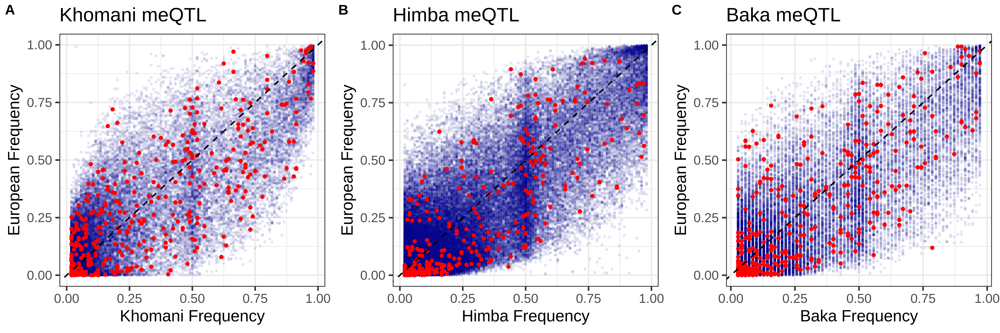

In [33]:
library(cowplot)

plot1 <- ggplot(Baka_1kg_freq, aes(x = Baka_freq, y = Euro_freq, color=factor(in_clock), alpha=factor(in_clock))) + 
  geom_point(size=5, data = subset(Baka_1kg_freq, in_clock == 0)) + 
  geom_point(size=8, data = subset(Baka_1kg_freq, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Baka meQTL", x = "Baka Frequency", y = "European Frequency") + 
    theme_bw(base_size = 70) + 
  theme(legend.position = "none") + 
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") 
options(repr.plot.width = 30, repr.plot.height = 30)


plot2 <- ggplot(KHS_1kg_freq, aes(x = KHS_freq, y = Euro_freq, color=factor(in_clock), alpha=factor(in_clock))) + 
  geom_point(size=5, data = subset(KHS_1kg_freq, in_clock == 0)) + 
  geom_point(size=8, data = subset(KHS_1kg_freq, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Khomani meQTL", x = "Khomani Frequency", y = "European Frequency") + 
    theme_bw(base_size = 70) + 
  theme(legend.position = "none") + 
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") 

plot3 <- ggplot(Himba_1kg_freq, aes(x = Himba_freq, y = Euro_freq, color=factor(in_clock), alpha=factor(in_clock))) + 
  geom_point(size=5, data = subset(Himba_1kg_freq, in_clock == 0)) + 
  geom_point(size=8, data = subset(Himba_1kg_freq, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Himba meQTL", x = "Himba Frequency", y = "European Frequency") + 
  theme_bw(base_size = 70) + 
  theme(legend.position = "none") +
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") 



combined_plots <- plot_grid( plot2, plot3,plot1, nrow=1, labels = c("A", "B", "C"),
                    label_size = 60) 
options(repr.plot.width = 60, repr.plot.height = 20)

#svg("Figure6.svg", width=60, height=20)
# Display the combined plot
print(combined_plots)
#dev.off()


Warning message in get_plot_component(plot, "guide-box"):
"Multiple components found; returning the first one. To return all, use `return_all = TRUE`."


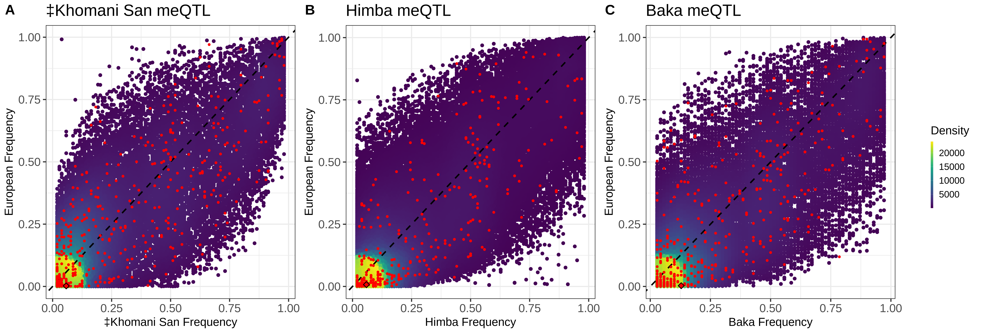

In [41]:

library(viridis)
library(ggpointdensity)
# Plot 1
plot1 <- ggplot(Baka_1kg_freq, mapping = aes(x = Baka_freq, y = Euro_freq)) + 
  geom_pointdensity(data = subset(Baka_1kg_freq, in_clock == 0), aes(x = Baka_freq, y = Euro_freq), size = 7, adjust = 0.5) + 
  scale_color_viridis()+
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size = 3) + 
  labs(title = "Baka meQTL", x = "Baka Frequency", y = "European Frequency") + 
  theme_bw() + 
     theme_bw(base_size = 50) + 
  theme(legend.position = "none",
        axis.text = element_text(size = 50),
        axis.title = element_text(size = 50, margin = margin(r = 10)),
         
        plot.title = element_text(size = 70), plot.margin = margin(t = 20, r = 20, b = 20, l = 20)) +
  geom_point(size=5, data = subset(Baka_1kg_freq, in_clock == 1), color="red")  +
 geom_point(size=8, data = subset(Baka_1kg_freq, highlighted == 1),pch=23, fill = "red", color = "black", stroke = 2.5)

legend <- get_legend(ggplot(Baka_1kg_freq, mapping = aes(x = Baka_freq, y = Euro_freq)) + 
  geom_pointdensity(data = subset(Baka_1kg_freq, in_clock == 0), aes(x = Baka_freq, y = Euro_freq), size = 7, adjust = 0.5) + 
scale_color_viridis(name = "Density", 
                        guide = guide_colorbar(barwidth = 0.75, barheight = 20)) +  # Adjust the bar width and height
    theme(
      legend.position = "right",
      legend.text = element_text(size = 15),  # Increase text size for better readability
      legend.title = element_text(size = 20)  # Title size
    ) +
    
              
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size = 3) + 
  labs(title = "Baka meQTL", x = "Baka Frequency", y = "European Frequency") + 
  theme_bw() + 
     theme_bw(base_size = 50) + 
  theme(legend.position = "right",
        axis.text = element_text(size = 50),
        axis.title = element_text(size = 50, margin = margin(r = 10)),
        plot.title = element_text(size = 70), plot.margin = margin(t = 20, r = 20, b = 20, l = 20)) +
  geom_point(size=5, data = subset(Baka_1kg_freq, in_clock == 1), color="red")  +
 geom_point(size=8, data = subset(Baka_1kg_freq, highlighted == 1),pch=23, fill = "red", color = "black", stroke = 2.5))


# Plot 2
plot2 <- ggplot(KHS_1kg_freq, mapping= aes(x = KHS_freq, y = Euro_freq)) + 
    geom_pointdensity(data = subset(KHS_1kg_freq, in_clock == 0), aes(x = KHS_freq, y = Euro_freq),  size = 7, adjust = 0.5) + 
 scale_color_viridis()+
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size = 3) + 
  labs(title = "\u2021Khomani San meQTL", x = "\u2021Khomani San Frequency", y = "European Frequency") + 
 theme_bw() + 
     theme_bw(base_size = 50) + 
  theme(legend.position = "none",
        axis.text = element_text(size = 50),
        axis.title = element_text(size = 50, margin = margin(r = 10)),
         
        plot.title = element_text(size = 70), plot.margin = margin(t = 20, r = 20, b = 20, l = 20))+
  geom_point(size=5, data = subset(KHS_1kg_freq, in_clock == 1), color="red") +
 geom_point(size=8, data = subset(KHS_1kg_freq, highlighted == 1), pch=23, fill = "red", color = "black", stroke = 2.5)

# Plot 3
plot3 <- ggplot(Himba_1kg_freq, mapping = aes(x = Himba_freq, y = Euro_freq)) + 
    geom_pointdensity(data = subset(Himba_1kg_freq, in_clock == 0), aes(x = Himba_freq, y = Euro_freq), size = 7, adjust = 0.5) + 
 scale_color_viridis()+
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size = 3) + 
  labs(title = "Himba meQTL", x = "Himba Frequency", y = "European Frequency") + 
  theme_bw() + 
     theme_bw(base_size = 50) + 
  theme(legend.position = "none",
        axis.text = element_text(size = 50),
        axis.title = element_text(size = 50, margin = margin(r = 10)),
         
        plot.title = element_text(size = 70 ), plot.margin = margin(t = 20, r = 20, b = 20, l = 20))+
  geom_point(size=5, data = subset(Himba_1kg_freq, in_clock == 1), color="red") +
 geom_point(size=8, data = subset(Himba_1kg_freq, highlighted == 1), pch=23, fill = "red", color = "black", stroke = 2.5)


# Combined plots
combined_plots <- plot_grid(plot2, plot3, plot1, legend, nrow = 1, labels = c("A", "B", "C"), rel_widths=(c(1,1,1,1/3)), label_size = 60)

options(repr.plot.width = 60, repr.plot.height = 20)

# Display the combined plot
print(combined_plots)


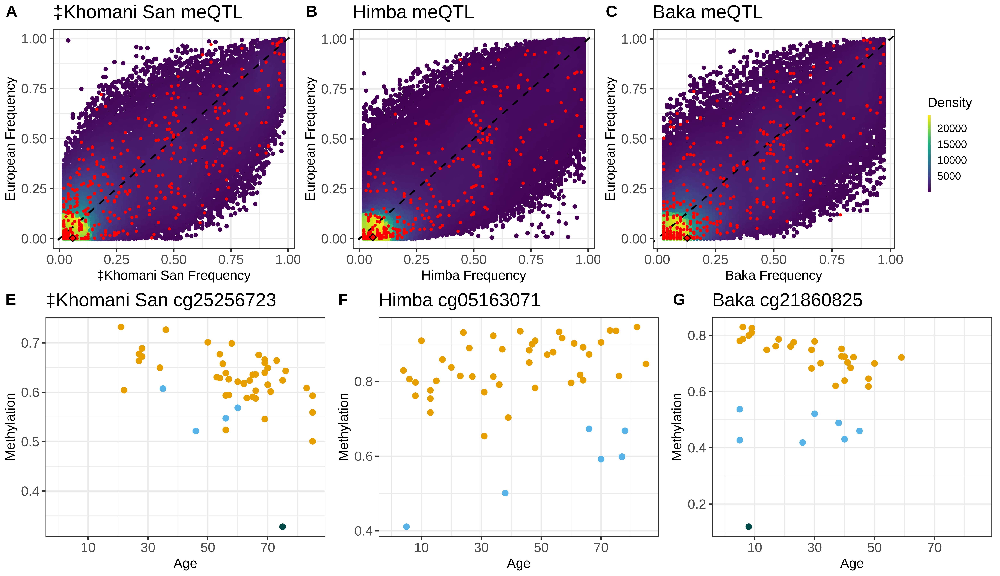

In [42]:
options(repr.plot.width = 52, repr.plot.height = 30)

load("/share/hennlab/users/glmeeks/age_methylation/EMMAX_meqtl/invariant_meqtl.RData")
plot_grid(combined_plots, combined_plot, nrow=2)

Warning message:
"Removed 7262 rows containing missing values or values outside the scale range (`geom_point()`)."


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.000e+00 1.880e-06 5.591e-05 1.360e-04 2.130e-04 4.381e-02 

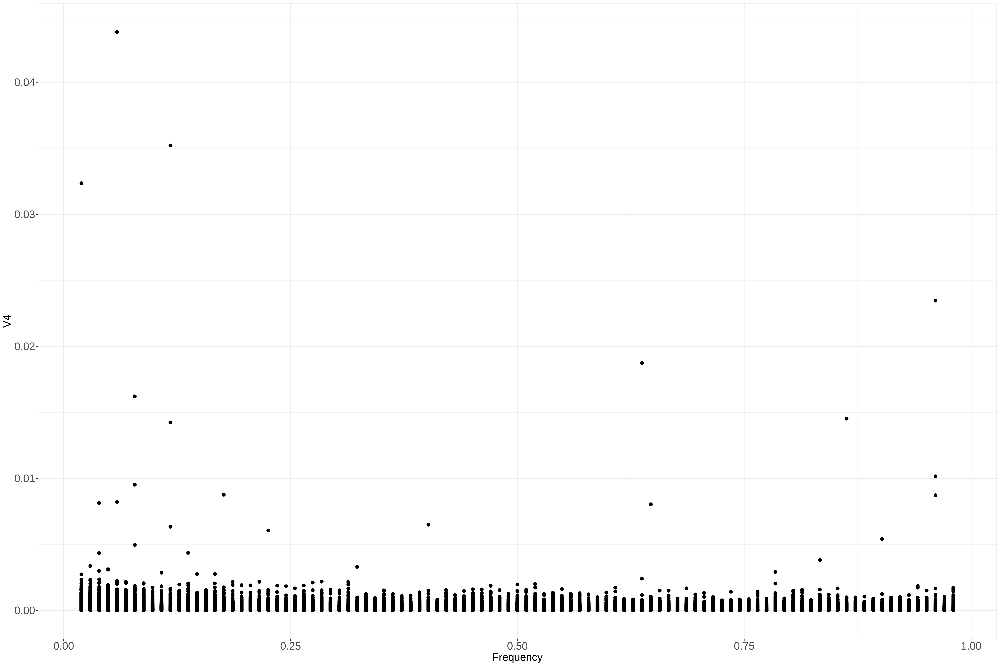

In [36]:
##do this with the full all meqtls list to check the 50% scatter cloud
Himba_meqtls$freq <- Himba_1kg_freq[match(Himba_meqtls$snp, Himba_1kg_freq$ID), "Himba_freq"][[1]]

# Create the scatter plot
scatter_plot <- ggplot(Himba_meqtls, aes(x = freq, y = V4)) +
  geom_point(size = 5, color = "black") +  # Customize point size and color
  labs(x = "Frequency", y = "V4") +  # Label axes
  theme_bw(base_size = 20) +  # Use minimal theme and set base font size
  theme(
    plot.title = element_text(size = 35, face = "bold"),  # Title font size
    axis.title = element_text(size = 35),  # Axis title font size
    axis.text = element_text(size = 35)  # Axis text font size
  )

# Display the scatter plot
print(scatter_plot)
summary(Himba_meqtls$V4)

In [ ]:
KHS_Baka <- read.delim("KHS_meqtl_Baka_comparison/combined_KHS_Baka_meqtls.txt", sep="", header=FALSE)
KHS_Baka[KHS_Baka == ""] <- NA
KHS_Baka <- na.omit(KHS_Baka)
head(KHS_Baka)
nrow(KHS_Baka)

Himba_Baka <- read.delim("Himba_meqtl_Baka_comparison/combined_Himba_Baka_meqtls.txt", sep="", header=FALSE)
Himba_Baka[Himba_Baka == ""] <- NA
Himba_Baka <- na.omit(Himba_Baka)
head(Himba_Baka)
nrow(Himba_Baka)


Himba_KHS <- read.delim("Himba_meqtl_KHS_comparison/combined_Himba_KHS_meqtls.txt", sep="", header=FALSE)
Himba_KHS[Himba_KHS == ""] <- NA
Himba_KHS <- na.omit(Himba_KHS)
head(Himba_KHS)
nrow(Himba_KHS)


names(KHS_Baka) <- c("cpg", "snp", "af1", "af2")
KHS_Baka$in_clock <- 0
KHS_Baka[KHS_Baka$cpg %in% clock_cpgs, "in_clock"] <- 1
KHS_Baka$in_clock <- as.factor(KHS_Baka$in_clock)
print(paste0("% that are 0 in af1: ", nrow(KHS_Baka[KHS_Baka$af1 == 0, ])/nrow(KHS_Baka)))
print(paste0("% that are 0 in af2: ", nrow(KHS_Baka[KHS_Baka$af2 == 0, ])/nrow(KHS_Baka)))
print(paste0("% that are not found in af2: ", nrow(KHS_Baka[KHS_Baka$af2 == "notfound", ])/nrow(KHS_Baka)))
print(paste0("% that are not found in af1: ", nrow(KHS_Baka[KHS_Baka$af1 == "notfound", ])/nrow(KHS_Baka)))
KHS_Baka[KHS_Baka$af1 == "notfound", "af1"] <- 0
KHS_Baka[KHS_Baka$af2 == "notfound", "af2"] <- 0
KHS_Baka$af1 <- as.numeric(KHS_Baka$af1)
KHS_Baka$af2 <- as.numeric(KHS_Baka$af2)

names(Himba_Baka) <- c("cpg", "snp", "af1", "af2")
Himba_Baka$in_clock <- 0
Himba_Baka[Himba_Baka$cpg %in% clock_cpgs, "in_clock"] <- 1
Himba_Baka$in_clock <- as.factor(Himba_Baka$in_clock)
print(paste0("% that are 0 in af1: ", nrow(Himba_Baka[Himba_Baka$af1 == 0, ])/nrow(Himba_Baka)))
print(paste0("% that are 0 in af2: ", nrow(Himba_Baka[Himba_Baka$af2 == 0, ])/nrow(Himba_Baka)))
print(paste0("% that are not found in af2: ", nrow(Himba_Baka[Himba_Baka$af2 == "notfound", ])/nrow(Himba_Baka)))
print(paste0("% that are not found in af1: ", nrow(Himba_Baka[Himba_Baka$af1 == "notfound", ])/nrow(Himba_Baka)))
Himba_Baka[Himba_Baka$af1 == "notfound", "af1"] <- 0
Himba_Baka[Himba_Baka$af2 == "notfound", "af2"] <- 0
Himba_Baka$af1 <- as.numeric(Himba_Baka$af1)
Himba_Baka$af2 <- as.numeric(Himba_Baka$af2)


names(Himba_KHS) <- c("cpg", "snp", "af1", "af2")
Himba_KHS$in_clock <- 0
Himba_KHS[Himba_KHS$cpg %in% clock_cpgs, "in_clock"] <- 1
Himba_KHS$in_clock <- as.factor(Himba_KHS$in_clock)
print(paste0("% that are 0 in af1: ", nrow(Himba_KHS[Himba_KHS$af1 == 0, ])/nrow(Himba_KHS)))
print(paste0("% that are 0 in af2: ", nrow(Himba_Baka[Himba_KHS$af2 == 0, ])/nrow(Himba_KHS)))
print(paste0("% that are not found in af2: ", nrow(Himba_KHS[Himba_KHS$af2 == "notfound", ])/nrow(Himba_KHS)))
print(paste0("% that are not found in af1: ", nrow(Himba_KHS[Himba_KHS$af1 == "notfound", ])/nrow(Himba_KHS)))
Himba_KHS[Himba_KHS$af1 == "notfound", "af1"] <- 0
Himba_KHS[Himba_KHS$af2 == "notfound", "af2"] <- 0
Himba_KHS$af1 <- as.numeric(Himba_KHS$af1)
Himba_KHS$af2 <- as.numeric(Himba_KHS$af2)



options(repr.plot.width = 70, repr.plot.height = 20)
custom_breaks <- seq(0, 1, by = 0.1)
custom_breaks_ <- seq(0, 1, by = 0.1)
plot1 <- ggplot(KHS_Baka, aes(x = af1, y = af2, color=factor(in_clock), alpha=in_clock)) + 
  geom_point(size=5, data = subset(KHS_Baka, in_clock == 0)) + 
  geom_point(size=8, data = subset(KHS_Baka, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Khomani vs Baka frequency", x = "Khomani Frequency", y = "Baka Frequency") + 
  theme_minimal(base_size = 70) + 
  theme(axis.title = element_text(size = 70),
        axis.text = element_text(size = 70),
        plot.title = element_text(size = 70),
        legend.text = element_text(size = 70),
        legend.title = element_text(size = 70)) +
  scale_x_continuous(breaks = custom_breaks_) +
  scale_y_continuous(breaks = custom_breaks) +
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") +
  scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") 

plot2 <- ggplot(Himba_Baka, aes(x = af1, y = af2, color=factor(in_clock), alpha=in_clock)) + 
  geom_point(size=5, data = subset(Himba_Baka, in_clock == 0)) + 
  geom_point(size=8, data = subset(Himba_Baka, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Himba vs Baka frequency", x = "Himba Frequency", y = "Baka Frequency") + 
  theme_minimal(base_size = 70) + 
  theme(axis.title = element_text(size = 70),
        axis.text = element_text(size = 70),
        plot.title = element_text(size = 70),
        legend.text = element_text(size = 70),
        legend.title = element_text(size = 70)) +
  scale_x_continuous(breaks = custom_breaks_) +
  scale_y_continuous(breaks = custom_breaks) +
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide = "none") +
  scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") 

plot3 <- ggplot(Himba_KHS, aes(x = af1, y = af2, color=factor(in_clock), alpha=in_clock)) + 
  geom_point(size=5, data = subset(Himba_KHS, in_clock == 0)) + 
  geom_point(size=8, data = subset(Himba_KHS, in_clock == 1)) + 
  geom_abline(intercept = 0, slope = 1, color = "black", linetype = "dashed", size=3) + 
  labs(title = "Himba vs Khomani frequency", x = "Himba Frequency", y = "Khomani Frequency") + 
  theme_minimal(base_size = 70) + 
  theme(axis.title = element_text(size = 70),
        axis.text = element_text(size = 70),
        plot.title = element_text(size = 70),
        legend.text = element_text(size = 70),
        legend.title = element_text(size = 70)) +
  scale_x_continuous(breaks = custom_breaks_) +
  scale_y_continuous(breaks = custom_breaks) +
  scale_color_manual(values = c("0" = "darkblue", "1" = "red"), 
                     labels = c("MeQTL not in a published predictor", "MeQTL in a published predictor"), guide="none") +
  scale_alpha_manual(values = c("0" = 0.05, "1" = 1), guide = "none") #+
  #guides(color = guide_legend(title = "MeQTL Status"))


# Combine the plots into one row using cowplot
combined_plots <- plot_grid(plot1, plot2, plot3,  nrow=1, labels = c("A", "B", "C"),
                    label_size = 60)
options(repr.plot.width = 60, repr.plot.height = 20)
svg("Supp_meqtl_freqs_cross_population.svg", width=60, height=20)
# Display the combined plot
print(combined_plots)
dev.off()

In [ ]:
# Himba_top_meqtl <- read.delim("Himba_meqtl_eur_freq_update_to_Eur_freq_base/combined_Himba_meqtls.txt", sep=" ", header=FALSE)
# Himba_top_meqtl <- na.omit(Himba_top_meqtl[!duplicated(Himba_top_meqtl),])
# nrow(Himba_top_meqtl)
# names(Himba_top_meqtl) <- c("cpg", "snp", "af", "euro_af")
# Himba_top_meqtl$in_clock <- 0
# Himba_top_meqtl[Himba_top_meqtl$cpg %in% clock_cpgs, "in_clock"] <- 1

# Himba_top_meqtl[Himba_top_meqtl$af == 0, ]

In [ ]:

# ##Merged DATA age meqtls
# merged_age_meqtls <- read.delim("age_meqtls_merged_freqs.txt", sep=" ", header=FALSE)

# names(merged_age_meqtls) <- c("cpg", "ID", "Himba_AF", "KHS_AF", "Baka_AF", "Euro_AF", "diff")
# merged_age_meqtls$Horvath <- FALSE
# merged_age_meqtls$All_AF <- (merged_age_meqtls$Himba_AF*102 + merged_age_meqtls$KHS_AF*104 + merged_age_meqtls$Baka_AF*70)/276
# merged_age_meqtls[merged_age_meqtls$Euro_alt_af == "notfound", "Euro_AF"] <- NA
# merged_age_meqtls[is.na(merged_age_meqtls$Euro_AF), "Euro_AF"] <- 0
# merged_age_meqtls$Euro_AF <- as.numeric(merged_age_meqtls$Euro_AF)

# merged_age_meqtls$eur_all_diff <- abs(merged_age_meqtls$All_AF - merged_age_meqtl$Euro_AF)
# merged_age_meqtls$eur_khs_diff <- abs(merged_age_meqtls$KHS_AF - merged_age_meqtls$Euro_AF)
# merged_age_meqtl$eur_baka_diff <- abs(merged_age_meqtl$Baka_AF - merged_age_meqtl$Euro_AF)
# merged_age_meqtl$eur_himba_diff <- abs(merged_age_meqtl$Himba_AF - afs$Euro_AF)
# #######

# ####check for a correlation between p_val diff and AF  -> this actually doesn't make much sense. I should just check for the different
# ##predictors and how differentiated the meQTLs are.


In [ ]:
#############

# head(afs)

# plot(afs$ewas_p_val_diff_regress, afs$eur_himba_diff)
# plot(afs$ewas_p_val_diff_regress, afs$eur_baka_diff)
# plot(afs$ewas_p_val_diff_regress, afs$eur_khs_diff)
# plot(afs$ewas_p_val_diff_regress, afs$eur_all_diff)

# plot(afs$ewas_p_val_diff_regress, afs$himba_alt_af)
# plot(afs$ewas_p_val_diff_regress, afs$Baka_alt_af)
# plot(afs$ewas_p_val_diff_regress, afs$KHS_alt_af)
# plot(afs$ewas_p_val_diff_regress, afs$all_af)

# # plot(afs$eur_all_diff, afs$afs$ewas_p_val_diff_regress)
# # Horvath_afs <- afs[afs$Horvath,]
# # plot(Horvath_afs$eur_all_diff, Horvath_afs$ewas_p_val_diff_regress)
# # Horvath_afs
# # pos_afs <- afs[afs$ewas_p_val_diff_regress > 0,]
# # plot(pos_afs$eur_all_diff, pos_afs$ewas_p_val_diff_regress)

# # plot(afs$all_af, afs$Euro_alt_af, xlab = "all_af", ylab = "Euro_alt_af")
# # abline(0, 1, col = "red")

# # # Plot afs$Baka_alt_af vs afs$Euro_alt_af
# # plot(afs$Baka_alt_af, afs$Euro_alt_af, xlab = "Baka_alt_af", ylab = "Euro_alt_af")
# # abline(0, 1, col = "red")

# # # Plot afs$himba_alt_af vs afs$Euro_alt_af
# # plot(afs$himba_alt_af, afs$Euro_alt_af, xlab = "himba_alt_af", ylab = "Euro_alt_af")
# # abline(0, 1, col = "red")

# # # Plot afs$KHS_alt_af vs afs$Euro_alt_af
# # plot(afs$KHS_alt_af, afs$Euro_alt_af, xlab = "KHS_alt_af", ylab = "Euro_alt_af")
# # abline(0, 1, col = "red")



In [7]:
# ###all meqtls in merged data

# all_meqtl <- read.delim("merged_meqtl_freqs_in_Eur.txt", sep=" ", header=FALSE)
# names(all_meqtl) <- c("cpg", "snp", "Himba_af", "Baka_af", "KHS_af", "Euro_af")

# # Plot afs$Baka_alt_af vs afs$Euro_alt_af
# all_meqtl$all_af <- (all_meqtl$Himba_af*102 + all_meqtl$KHS_af*104 + all_meqtl$Baka_af*70)/276

# all_meqtl <- all_meqtl[!all_meqtl$Euro_af == "notfound",]
# #all_meqtl[all_meqtl$Euro_af == "notfound", "Euro_af"] <- 0

# plot(all_meqtl$Baka_af, all_meqtl$Euro_af, xlab = "Baka_alt_af", ylab = "Euro_alt_af")
# abline(0, 1, col = "red")

# # Plot afs$himba_alt_af vs afs$Euro_alt_af
# plot(all_meqtl$Himba_af, all_meqtl$Euro_af, xlab = "himba_alt_af", ylab = "Euro_alt_af")
# abline(0, 1, col = "red")

# # Plot afs$KHS_alt_af vs afs$Euro_alt_af
# plot(all_meqtl$KHS_af, all_meqtl$Euro_af, xlab = "KHS_alt_af", ylab = "Euro_alt_af")
# abline(0, 1, col = "red")

# all_meqtl$KHS_diff <- abs(all_meqtl$KHS_af - as.numeric(all_meqtl$Euro_af))
# all_meqtl$Baka_diff <- abs(all_meqtl$Baka_af - as.numeric(all_meqtl$Euro_af))
# all_meqtl$Himba_diff <- abs(all_meqtl$Himba_af - as.numeric(all_meqtl$Euro_af))
# # Combine the variables into a single dataframe
# diff_data <- data.frame(
#   Group = rep(c("KHS_diff", "Baka_diff", "Himba_diff"), each = nrow(all_meqtl)),
#   Difference = c(all_meqtl$KHS_diff, all_meqtl$Baka_diff, all_meqtl$Himba_diff)
# )
# library(ggplot2)
# # Create violin plot
# p <- ggplot(diff_data, aes(x = Group, y = Difference, fill = Group)) +
#   geom_violin() +
#   scale_fill_manual(values = c("KHS_diff" = "blue", "Baka_diff" = "green", "Himba_diff" = "red")) +
#   labs(x = "", y = "Absolute Difference", title = "Violin Plot of Absolute Differences") +
#   theme_minimal()

# # Display the plot
# print(p)

# nrow(all_meqtl)

# meqtl <- all_meqtl[, 2:10]

# meqtl_unique <- meqtl[!duplicated(meqtl$snp), ]
# nrow(meqtl_unique)

# nrow(meqtl_unique[meqtl_unique$Euro_af == 0  , ])
# nrow(meqtl_unique[meqtl_unique$Euro_af == 0 | meqtl_unique$Euro_af == 1 , ]) / nrow(meqtl_unique)
# #meqtl_unique[meqtl_unique$Euro_af == 0 | meqtl_unique$Euro_af == 1 , ]


In [54]:
# library(ggplot2)

# # Read dataset 1
# afs <- read.delim("get_allele_freqs_output.txt", sep = " ", header = TRUE)
# Horvath <- read.csv("/share/hennlab/users/glmeeks/age_methylation/methylation_norm_EWAS/EMMAX/Horvath_test/AdditionalFile23predictor.csv")
# Horvath <- Horvath[-1,]
# Horvath_sites <- Horvath$CpGmarker
# afs$Horvath <- FALSE
# afs[afs$cpg %in% Horvath_sites, "Horvath"] <- TRUE
# afs$all_af <- (afs$himba_alt_af * 102 + afs$KHS_alt_af * 104 + afs$Baka_alt_af * 70) / 276
# afs[afs$Euro_alt_af == "notfound", "Euro_alt_af"] <- NA
# afs[is.na(afs$Euro_alt_af), "Euro_alt_af"] <- 0
# afs$Euro_alt_af <- as.numeric(afs$Euro_alt_af)
# afs$eur_all_diff <- abs(afs$all_af - afs$Euro_alt_af)
# afs$eur_khs_diff <- abs(afs$KHS_alt_af - afs$Euro_alt_af)
# afs$eur_baka_diff <- abs(afs$Baka_alt_af - afs$Euro_alt_af)
# afs$eur_himba_diff <- abs(afs$himba_alt_af - afs$Euro_alt_af)



# # Read dataset 2
# all_meqtl <- read.delim("combined_all_meqtl_uniq_freqs.out", sep = " ", header = FALSE)
# names(all_meqtl) <- c("cpg", "snp", "Himba_af", "Baka_af", "KHS_af", "Euro_af")
# all_meqtl$all_af <- (all_meqtl$Himba_af * 102 + all_meqtl$KHS_af * 104 + all_meqtl$Baka_af * 70) / 276
# all_meqtl[all_meqtl$Euro_af == "notfound", "Euro_af"] <- 0
# all_meqtl$KHS_diff <- abs(all_meqtl$KHS_af - as.numeric(all_meqtl$Euro_af))
# all_meqtl$Baka_diff <- abs(all_meqtl$Baka_af - as.numeric(all_meqtl$Euro_af))
# all_meqtl$Himba_diff <- abs(all_meqtl$Himba_af - as.numeric(all_meqtl$Euro_af))

# # Create violin plots
# p <- ggplot() +
#   geom_violin(data = all_meqtl, aes(x = "", y = KHS_diff), fill = "skyblue", color = "blue", alpha = 0.8) +
#   geom_violin(data = afs, aes(x = "", y = eur_khs_diff), fill = "orange", color = "red", alpha = 0.3) +
#   ggtitle("Comparison of KHS_diff between Datasets") +
#   xlab("") +
#   ylab("KHS_diff") +
#   theme_minimal()

# print(p)

# p <- ggplot() +
#   geom_violin(data = all_meqtl, aes(x = "", y = Baka_diff), fill = "skyblue", color = "blue", alpha = 0.8) +
#   geom_violin(data = afs, aes(x = "", y = eur_baka_diff), fill = "orange", color = "red", alpha = 0.3) +
#   ggtitle("Comparison of Baka_diff between Datasets") +
#   xlab("") +
#   ylab("KHS_diff") +
#   theme_minimal()

# print(p)

# p <- ggplot() +
#   geom_violin(data = all_meqtl, aes(x = "", y = Himba_diff), fill = "skyblue", color = "blue", alpha = 0.8) +
#   geom_violin(data = afs, aes(x = "", y = eur_himba_diff), fill = "orange", color = "red", alpha = 0.3) +
#   ggtitle("Comparison of KHS_diff between Datasets") +
#   xlab("") +
#   ylab("KHS_diff") +
#   theme_minimal()

# print(p)

In [ ]:
# library(ggplot2)
# # Convert Euro_af to numeric if it's not already numeric
# all_meqtl$Euro_af <- as.numeric(all_meqtl$Euro_af)

# # Plot scatter density for all_meqtl values of KHS vs EUR
# p <- ggplot(all_meqtl, aes(x = KHS_af, y = Euro_af)) +
#   geom_point(alpha = 0.3) +  # Scatterplot with transparency
#   #geom_density_2d_filled() +  # Add density contours filled with color
#   labs(x = "KHS_af", y = "Euro_af", title = "Scatter Density Plot: KHS vs EUR") +
#   theme_minimal()

# print(p)

# # Plot scatter density for all_meqtl values of KHS vs EUR
# p <- ggplot(all_meqtl, aes(x = Baka_af, y = Euro_af)) +
#   geom_point(alpha = 0.3) +  # Scatterplot with transparency
#   #geom_density_2d_filled() +  # Add density contours filled with color
#   labs(x = "KHS_af", y = "Euro_af", title = "Scatter Density Plot: Baka vs EUR") +
#   theme_minimal()

# print(p)

# # Plot scatter density for all_meqtl values of KHS vs EUR
# p <- ggplot(all_meqtl, aes(x = Himba_af, y = Euro_af)) +
#   geom_point(alpha = 0.3) +  # Scatterplot with transparency
#   #geom_density_2d_filled() +  # Add density contours filled with color
#   labs(x = "KHS_af", y = "Euro_af", title = "Scatter Density Plot: Himba vs EUR") +
#   theme_minimal()

# print(p)